## The purpose of this project is to understand the interactions of our business with customers online: how we have engaged with customers through different social media platforms namely Facebook, LInkedIn, Instagram and Twitter.  The insights we derive from this will inform a better approach to reaching customers in the future with the type of content they like. If customers see the type of content they like, they remain happy and engaged with us. Happy and engaged customers equate to more profit,  so we want to understand the best way to keep our customers engaged with us through their favorite contents.

## Prerequisite: Data Preparation
## The dataframe for the "Twitter" dataset contains 147 columns and 8529 rows before cleaning and validation. I checked each column one by one for missing values, their data types, duplicates and validity. I discovered that 110 of these columns have null values only. Since these are empty columns, I removed them from the dataset. I also removed possible rows that might be duplicated.  I converted the "Date" column to a DateTime type, and I added the columns "Day" and "Month" to denote the day of the week and the corresponding month of each date in the "Date" column. I did not convert the "Post ID" column to floats, even though it's a numerical type: we will not be doing float-type computation on it. For columns that carry numerical types of values, I converted the numerical values to floats - for better computation; and finally, I replaced the remaining missing numerical values with 0.
## The dataset contains 39 columns and 8529 rows after cleaning and validation.
## These data cleaning and validation steps are also applied to the Facebook, Instagram and LinkedIn datasets respectively.


## **Step 1: Data familiarization. Here we see what the dataframe looks like, which columns have null values, which data types each column contains, and how many rows there are in the dataframe. Hidden cells in this workspace provide additional information.**

In [192]:
# Importing relevant libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

twitter = pd.read_csv('Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Twitter.csv')

In [252]:
# What does our dataframe look like? How many rows and columns do we have?

twitter.shape

(8529, 39)

In [253]:
# Let's check for missing values. Quite a lot of the columns have missing values as shown below

twitter.isna().sum()

Date                                0
Post ID                             0
Network                             0
Post Type                           0
Content Type                        0
Profile                             0
Sent by                             0
Link                                0
Post                                0
Linked Content                      0
Impressions                         0
Organic Impressions                 0
Potential Reach                     0
Engagement Rate (per Impression)    0
Engagements                         0
Reactions                           0
Likes                               0
Comments                            0
Shares                              0
Click-Through Rate                  0
Post Link Clicks                    0
Other Post Clicks                   0
Post Clicks (All)                   0
Post Media Clicks                   0
Post Hashtag Clicks                 0
Post Detail Expand Clicks           0
Profile Clic

In [195]:
# Cleaning the dataframe by removing columns where ALL the values are empty and by removing duplicated rows.

twitter = twitter.dropna(axis = 'columns', how = 'all').drop_duplicates()

In [254]:
# Let's see what the dataframe looks like now

twitter.info()
twitter

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8529 entries, 0 to 8528
Data columns (total 39 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              8529 non-null   datetime64[ns]
 1   Post ID                           8529 non-null   int64         
 2   Network                           8529 non-null   object        
 3   Post Type                         8529 non-null   object        
 4   Content Type                      8529 non-null   object        
 5   Profile                           8529 non-null   object        
 6   Sent by                           8529 non-null   object        
 7   Link                              8529 non-null   object        
 8   Post                              8529 non-null   object        
 9   Linked Content                    8529 non-null   object        
 10  Impressions                       8529 non-null 

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
0,2023-07-13 10:57:00,1679429829567946759,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1679429...,Your money should not be a gamble. Before you ...,https://twitter.com/StanbicIBTC/status/1679429...,445.0,445.0,345718.0,3.60,16.0,4.0,4.0,2.0,1.0,0.00,0.0,9.0,9.0,1.0,0.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,CIB Posts,Thursday,July
1,2023-07-12 20:03:00,1679204777081864192,Twitter,Tweet,Text,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679204...,What skill (s) do you have that no one ever ta...,0,2961.0,2961.0,347102.0,1.76,52.0,11.0,11.0,20.0,3.0,0.00,0.0,18.0,18.0,0.0,1.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Wednesday,July
2,2023-07-12 19:00:00,1679189012798660608,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679189...,Sade was able to acquire a home loan and make ...,https://bit.ly/StanbicIBTCHomeLoans https://tw...,850.0,850.0,347594.0,4.24,36.0,4.0,4.0,1.0,3.0,0.82,7.0,21.0,28.0,11.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,Weekly Wealth Posts,Wednesday,July
3,2023-07-12 18:20:00,1679179017084354560,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679179...,Here are some mistakes you shouldn’t make duri...,https://twitter.com/StanbicIBTC/status/1679179...,1499.0,1499.0,349169.0,3.40,51.0,13.0,13.0,3.0,5.0,0.00,0.0,30.0,30.0,24.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0,Wednesday,July
4,2023-07-11 12:50:00,1678733396992745472,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1678733...,Safeguard every aspect of your operations with...,https://twitter.com/StanbicIBTC/status/1678733...,1184.0,1184.0,345653.0,1.52,18.0,7.0,7.0,3.0,1.0,0.00,0.0,7.0,7.0,3.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,Insurance Limited Posts Weekly Wealth Posts,Tuesday,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8525,2013-02-18 19:13:00,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8526,2013-02-18 11:18:00,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8527,2013-02-18 09:01:00,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February


In [197]:
# Next, we want to make sure the "Date" column is converted to the DateTime type and that the figures in other columns are converted to float types for easier computing.



twitter['Date'] = pd.to_datetime(twitter['Date'])
twitter = twitter.replace(['%', ','], ['', ''], regex = True)
twitter.info()
twitter

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8529 entries, 0 to 8528
Data columns (total 37 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              8529 non-null   datetime64[ns]
 1   Post ID                           8529 non-null   int64         
 2   Network                           8529 non-null   object        
 3   Post Type                         8529 non-null   object        
 4   Content Type                      8529 non-null   object        
 5   Profile                           8529 non-null   object        
 6   Sent by                           8529 non-null   object        
 7   Link                              8481 non-null   object        
 8   Post                              8529 non-null   object        
 9   Linked Content                    4978 non-null   object        
 10  Impressions                       7842 non-null 

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags
0,2023-07-13 10:57:00,1679429829567946759,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1679429...,Your money should not be a gamble. Before you ...,https://twitter.com/StanbicIBTC/status/1679429...,445,445,345718,3.6,16,4,4,2.0,1.0,NaN,NaN,9,9,1,0.0,7,1.0,0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1,CIB Posts
1,2023-07-12 20:03:00,1679204777081864192,Twitter,Tweet,Text,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679204...,What skill (s) do you have that no one ever ta...,NaN,2961,2961,347102,1.76,52,11,11,20.0,3.0,NaN,NaN,18,18,NaN,1.0,12,5.0,0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,2023-07-12 19:00:00,1679189012798660608,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679189...,Sade was able to acquire a home loan and make ...,https://bit.ly/StanbicIBTCHomeLoans https://tw...,850,850,347594,4.24,36,4,4,1.0,3.0,0.82,7.0,21,28,11,0.0,10,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,11,Weekly Wealth Posts
3,2023-07-12 18:20:00,1679179017084354560,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679179...,Here are some mistakes you shouldn’t make duri...,https://twitter.com/StanbicIBTC/status/1679179...,1499,1499,349169,3.4,51,13,13,3.0,5.0,NaN,NaN,30,30,24,0.0,5,1.0,0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,24,NaN
4,2023-07-11 12:50:00,1678733396992745472,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1678733...,Safeguard every aspect of your operations with...,https://twitter.com/StanbicIBTC/status/1678733...,1184,1184,345653,1.52,18,7,7,3.0,1.0,NaN,NaN,7,7,3,0.0,1,3.0,0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,3,Insurance Limited Posts Weekly Wealth Posts
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,NaN,NaN,NaN,166372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8525,2013-02-18 19:13:00,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,NaN,NaN,NaN,166372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8526,2013-02-18 11:18:00,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,NaN,NaN,NaN,166372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8527,2013-02-18 09:01:00,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
# Converting needed columns to float types. In case there are empty values in any of these columns, we fill them with 0. It's a longer route but easier to understand.

twitter = twitter.astype({'Impressions' : 'float', 'Organic Impressions' : 'float', 'Potential Reach' : 'float','Engagement Rate (per Impression)' : 'float','Engagements' : 'float','Reactions' : 'float','Likes' : 'float','Comments' : 'float','Shares' : 'float','Click-Through Rate' : 'float','Post Link Clicks' : 'float','Other Post Clicks' : 'float','Post Clicks (All)' : 'float','Post Media Clicks' : 'float','Post Hashtag Clicks' : 'float','Post Detail Expand Clicks' : 'float','Profile Clicks' : 'float','Other Engagements' : 'float','App Engagements' : 'float','App Install Attempts' : 'float','App Opens' : 'float','Follows from Post' : 'float','Unfollows from Post' : 'float','bit.ly Link Clicks' : 'float','Video Views' : 'float', 'Media Views' : 'float' }).fillna(0)

# Also, let's add a "Day" and a "Month" column to denote the days and months corresponding to each date in the "Date" column.

twitter['Day'] = twitter['Date'].dt.day_name()
twitter['Month'] = twitter['Date'].dt.month_name()
twitter.info()
twitter

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8529 entries, 0 to 8528
Data columns (total 39 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              8529 non-null   datetime64[ns]
 1   Post ID                           8529 non-null   int64         
 2   Network                           8529 non-null   object        
 3   Post Type                         8529 non-null   object        
 4   Content Type                      8529 non-null   object        
 5   Profile                           8529 non-null   object        
 6   Sent by                           8529 non-null   object        
 7   Link                              8529 non-null   object        
 8   Post                              8529 non-null   object        
 9   Linked Content                    8529 non-null   object        
 10  Impressions                       8529 non-null 

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
0,2023-07-13 10:57:00,1679429829567946759,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1679429...,Your money should not be a gamble. Before you ...,https://twitter.com/StanbicIBTC/status/1679429...,445.0,445.0,345718.0,3.60,16.0,4.0,4.0,2.0,1.0,0.00,0.0,9.0,9.0,1.0,0.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,CIB Posts,Thursday,July
1,2023-07-12 20:03:00,1679204777081864192,Twitter,Tweet,Text,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679204...,What skill (s) do you have that no one ever ta...,0,2961.0,2961.0,347102.0,1.76,52.0,11.0,11.0,20.0,3.0,0.00,0.0,18.0,18.0,0.0,1.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Wednesday,July
2,2023-07-12 19:00:00,1679189012798660608,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679189...,Sade was able to acquire a home loan and make ...,https://bit.ly/StanbicIBTCHomeLoans https://tw...,850.0,850.0,347594.0,4.24,36.0,4.0,4.0,1.0,3.0,0.82,7.0,21.0,28.0,11.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,Weekly Wealth Posts,Wednesday,July
3,2023-07-12 18:20:00,1679179017084354560,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679179...,Here are some mistakes you shouldn’t make duri...,https://twitter.com/StanbicIBTC/status/1679179...,1499.0,1499.0,349169.0,3.40,51.0,13.0,13.0,3.0,5.0,0.00,0.0,30.0,30.0,24.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0,Wednesday,July
4,2023-07-11 12:50:00,1678733396992745472,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1678733...,Safeguard every aspect of your operations with...,https://twitter.com/StanbicIBTC/status/1678733...,1184.0,1184.0,345653.0,1.52,18.0,7.0,7.0,3.0,1.0,0.00,0.0,7.0,7.0,3.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,Insurance Limited Posts Weekly Wealth Posts,Tuesday,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8525,2013-02-18 19:13:00,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8526,2013-02-18 11:18:00,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8527,2013-02-18 09:01:00,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February


## The dataframe has now successfully been cleaned.
## Step 2: Next, we look at insights. We will try to keep our visualizations simple.

## On our Twitter outlet, photos are the types of posts that have the highest engagements on average, followed by videos, texts and links.

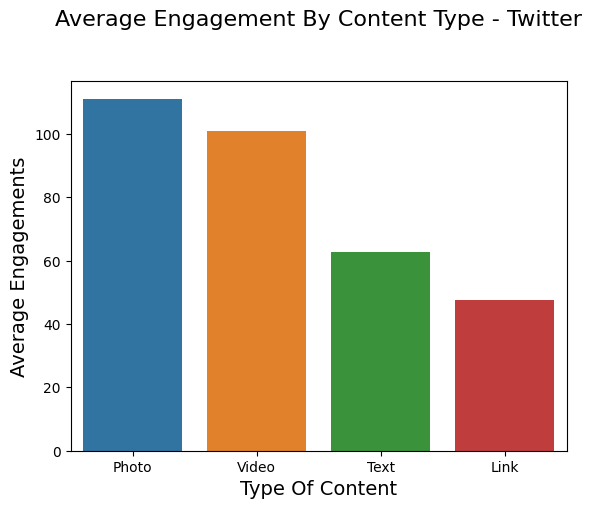

In [199]:
# On Twitter, photos are the types of posts that have the highest engagements on average, followed by videos, texts and links.
order = ['Photo','Video','Text', 'Link']
sns.barplot(x = 'Content Type', y = 'Engagements', data = twitter, ci = None, order = order)
order = ['Photo','Video','Text', 'Link']
plt.ylabel ('Average Engagements', fontsize = 14)
plt.xlabel('Type Of Content', fontsize = 14)
plt.title('Average Engagement By Content Type - Twitter', fontsize = 16,  pad = 40)
plt.show()

In [200]:
print(twitter['Sent by'].value_counts())

                     4240
Sophia Amuka         3250
Aramide Salami        541
Blessing Ubah         251
Kemi Amoo              92
Dunni Ogunsanya        76
Damilare Oyekanmi      71
Patience Nnaji          3
Lilian Ibekwe           2
Rebecca Oyebode         1
Kanayo Obiano           1
Philip Nwagwunor        1
Name: Sent by, dtype: int64


## Of the named individuals among the content creators, Sophia made the highest amount of posts

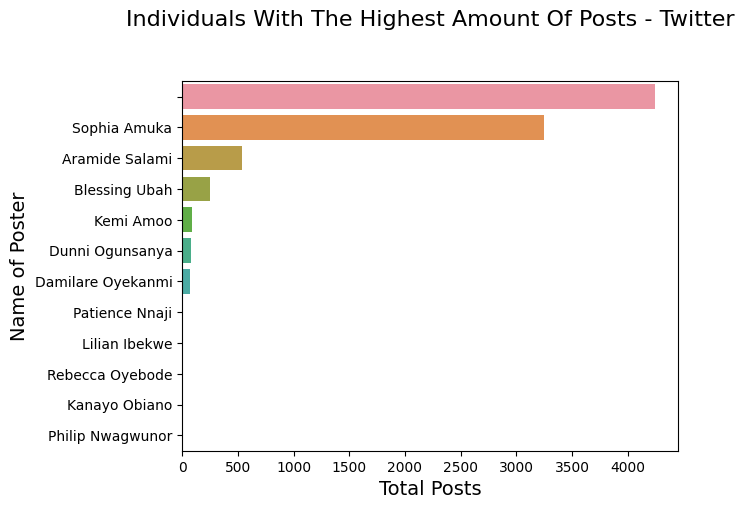

In [201]:
# On Twitter, of the named individuals among the content creators, Sophia made the highest amount of posts. Unnamed individual(s) or entities account for the highest amount of posts.

sns.countplot( y= 'Sent by', data = twitter, order = twitter['Sent by'].value_counts().index)
plt.title('Individuals With The Highest Amount Of Posts - Twitter', pad = 40, fontsize = 16)
plt.ylabel('Name of Poster', fontsize = 14)
plt.xlabel('Total Posts', fontsize = 14)
plt.show()

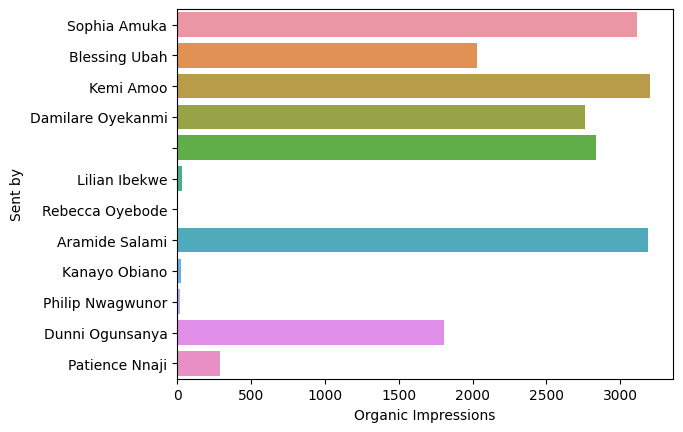

In [202]:
sns.barplot(x = 'Organic Impressions', y = 'Sent by', ci = None,  data = twitter)
plt.show()

## Damilare, Kemi, Sophia and Aramide's posts have the highest engagements on average.

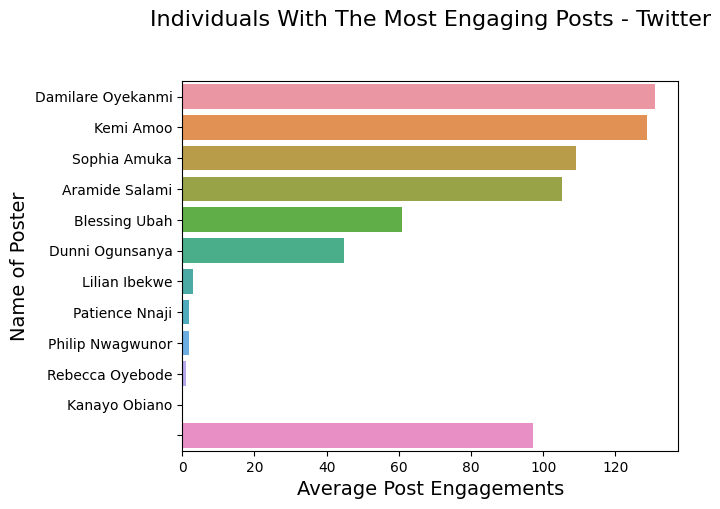

In [203]:
# on Twitter, Damilare, Kemi, Sophia and Aramide's posts have the highest engagements on average.

order =  ['Damilare Oyekanmi', 'Kemi Amoo', 'Sophia Amuka', 'Aramide Salami', 'Blessing Ubah', 'Dunni Ogunsanya', 'Lilian Ibekwe', 'Patience Nnaji', 'Philip Nwagwunor', 'Rebecca Oyebode', 'Kanayo Obiano', ' ' ]
sns.barplot(x = 'Engagements', y = 'Sent by', data = twitter, ci = None, order = order)
plt.title('Individuals With The Most Engaging Posts - Twitter', pad = 40, fontsize = 16)
plt.ylabel('Name of Poster', fontsize = 14)
plt.xlabel('Average Post Engagements', fontsize = 14)
plt.show()

In [204]:

twitter[twitter['Likes'] == twitter['Likes'].max()]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
4675,2019-10-21 17:00:00,1186311232724373504,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1186311...,Wouldn’t you like to know your investment pers...,https://advisory.stanbicibtc.com,13287.0,13287.0,1272499.0,112.68,14972.0,13528.0,13528.0,118.0,914.0,0.32,43.0,369.0,412.0,36.0,2.0,317.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,0,Monday,October


In [205]:
twitter[twitter['Reactions'] == twitter['Reactions'].max()]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
4675,2019-10-21 17:00:00,1186311232724373504,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1186311...,Wouldn’t you like to know your investment pers...,https://advisory.stanbicibtc.com,13287.0,13287.0,1272499.0,112.68,14972.0,13528.0,13528.0,118.0,914.0,0.32,43.0,369.0,412.0,36.0,2.0,317.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,0,Monday,October


In [206]:
twitter[twitter['Engagements'] == twitter['Engagements'].max()]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
4675,2019-10-21 17:00:00,1186311232724373504,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1186311...,Wouldn’t you like to know your investment pers...,https://advisory.stanbicibtc.com,13287.0,13287.0,1272499.0,112.68,14972.0,13528.0,13528.0,118.0,914.0,0.32,43.0,369.0,412.0,36.0,2.0,317.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,0,Monday,October


In [207]:
twitter[twitter['Shares'] == twitter['Shares'].max()]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
8144,2016-09-19 18:58:00,777929964008181760,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/7779299...,Want investments that don’t cost £89m and you ...,0,77765.0,77765.0,2193847.0,13.81,10743.0,322.0,322.0,135.0,1135.0,0.05,41.0,9083.0,9124.0,3698.0,0.0,4776.0,609.0,25.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,3698.0,0,Monday,September


In [208]:
twitter[twitter['Organic Impressions'] == twitter['Organic Impressions'].max()]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
8144,2016-09-19 18:58:00,777929964008181760,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/7779299...,Want investments that don’t cost £89m and you ...,0,77765.0,77765.0,2193847.0,13.81,10743.0,322.0,322.0,135.0,1135.0,0.05,41.0,9083.0,9124.0,3698.0,0.0,4776.0,609.0,25.0,0.0,0.0,0.0,21.0,0.0,0.0,0.0,3698.0,0,Monday,September


In [209]:
from collections import Counter
# Combine all elements in the "Post" column into a single string
joined_words = " ".join(twitter["Post"].tolist())

# Split the string into individual words
words = joined_words.split()

# Count the frequency of each word
commonwords = Counter(words)

# Get the most common 10 words
common10 = commonwords.most_common(10)

# Print the most common words
for word, count in common10:
    print(f"{word}: {count}")
    
#The 10 most common words are shown below

to: 7318
the: 6573
you: 4433
and: 4014
your: 3985
a: 2898
of: 2699
for: 2537
#ITCANBE: 2351
with: 2132


In [210]:
# We want to see the posts on Twitter that contain the 10 most common words, either individually or as a whole (excluding the "a" word in the list because it's not really a word)

posts_with_commonwords = twitter['Post'].str.contains('to|the|you|and|your|of|for|#ITCANBE|with')
twitter[posts_with_commonwords]

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Potential Reach,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Other Post Clicks,Post Clicks (All),Post Media Clicks,Post Hashtag Clicks,Post Detail Expand Clicks,Profile Clicks,Other Engagements,App Engagements,App Install Attempts,App Opens,Follows from Post,Unfollows from Post,bit.ly Link Clicks,Video Views,Media Views,Tags,Day,Month
0,2023-07-13 10:57:00,1679429829567946759,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1679429...,Your money should not be a gamble. Before you ...,https://twitter.com/StanbicIBTC/status/1679429...,445.0,445.0,345718.0,3.60,16.0,4.0,4.0,2.0,1.0,0.00,0.0,9.0,9.0,1.0,0.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,CIB Posts,Thursday,July
1,2023-07-12 20:03:00,1679204777081864192,Twitter,Tweet,Text,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679204...,What skill (s) do you have that no one ever ta...,0,2961.0,2961.0,347102.0,1.76,52.0,11.0,11.0,20.0,3.0,0.00,0.0,18.0,18.0,0.0,1.0,12.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Wednesday,July
2,2023-07-12 19:00:00,1679189012798660608,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679189...,Sade was able to acquire a home loan and make ...,https://bit.ly/StanbicIBTCHomeLoans https://tw...,850.0,850.0,347594.0,4.24,36.0,4.0,4.0,1.0,3.0,0.82,7.0,21.0,28.0,11.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,Weekly Wealth Posts,Wednesday,July
3,2023-07-12 18:20:00,1679179017084354560,Twitter,Tweet,Photo,'@StanbicIBTC,Blessing Ubah,https://twitter.com/StanbicIBTC/status/1679179...,Here are some mistakes you shouldn’t make duri...,https://twitter.com/StanbicIBTC/status/1679179...,1499.0,1499.0,349169.0,3.40,51.0,13.0,13.0,3.0,5.0,0.00,0.0,30.0,30.0,24.0,0.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,24.0,0,Wednesday,July
4,2023-07-11 12:50:00,1678733396992745472,Twitter,Tweet,Photo,'@StanbicIBTC,Sophia Amuka,https://twitter.com/StanbicIBTC/status/1678733...,Safeguard every aspect of your operations with...,https://twitter.com/StanbicIBTC/status/1678733...,1184.0,1184.0,345653.0,1.52,18.0,7.0,7.0,3.0,1.0,0.00,0.0,7.0,7.0,3.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,Insurance Limited Posts Weekly Wealth Posts,Tuesday,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8524,2013-02-18 19:39:00,303574464447270914,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035744...,FCMB CEO at the Stanbic IBTC sponsored BIT hub...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8525,2013-02-18 19:13:00,303567968183390209,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3035679...,Next event at the Stanbic IBTC sponsored BIT H...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8526,2013-02-18 11:18:00,303448511721132033,Twitter,Tweet,Text,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034485...,Now on at the Stanbic IBTC sponsored BIT Hub: ...,0,0.0,0.0,166372.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February
8527,2013-02-18 09:01:00,303413997238099969,Twitter,Tweet,Photo,'@StanbicIBTC,,https://twitter.com/StanbicIBTC/status/3034139...,'@SMWLagos starts today. We're proud sponsors ...,0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,Monday,February


## There isn't much difference between average post engagements when the most common words are used, and when they're not.

In [211]:
#There isn't much difference between average post engagements when the most common words are used, and when they're not

(twitter['Engagements'].mean(), twitter[posts_with_commonwords]['Engagements'].mean())

(101.20741001289717, 101.60250391236306)

In [212]:
# We want to look at the times of the day at which the most engaging posts happened on Twitter

time_of_high_post_engagemnts = twitter.groupby(pd.Grouper(key='Date', freq='T'))['Engagements'].sum()
high_engagement_posts_by_time = time_of_high_post_engagemnts.sort_values(ascending = False).head(10)
high_engagement_posts_by_time = high_engagement_posts_by_time.reset_index()
high_engagement_posts_by_time

,Date,Engagements
0,2019-10-21 17:00:00,14972.0
1,2016-09-19 18:58:00,10743.0
2,2023-03-07 17:38:00,6448.0
3,2015-08-10 12:34:00,5312.0
4,2020-10-21 12:58:00,4100.0
5,2020-04-02 14:00:00,4077.0
6,2020-01-09 10:27:00,4046.0
7,2017-03-30 14:44:00,3592.0
8,2023-02-04 17:00:00,3582.0
9,2019-01-19 14:51:00,3154.0


## As we see here, the top 3 posts with the highest engagements over the years came after 5pm. And 90% of the most-engaging posts overall came after 12pm.

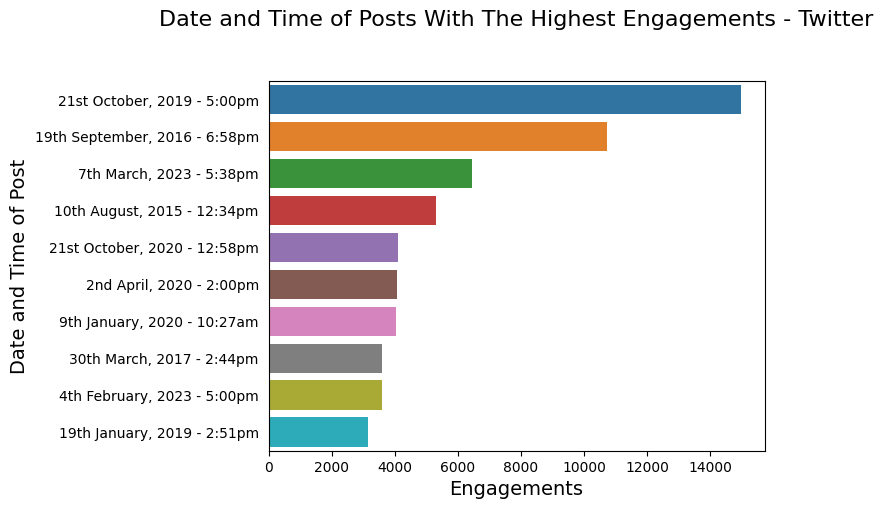

In [213]:
fig1 = sns.barplot(y = 'Date', x = 'Engagements', data = high_engagement_posts_by_time)
fig1.set_yticklabels(['21st October, 2019 - 5:00pm', '19th September, 2016 - 6:58pm', '7th March, 2023 - 5:38pm', '10th August, 2015 - 12:34pm', '21st October, 2020 - 12:58pm', '2nd April, 2020 - 2:00pm', '9th January, 2020 - 10:27am', '30th March, 2017 - 2:44pm', '4th February, 2023 - 5:00pm', '19th January, 2019 - 2:51pm'])
plt.tick_params(left = False)
plt.xlabel('Engagements', fontsize = 14)
plt.ylabel('Date and Time of Post', fontsize = 14)
plt.title('Date and Time of Posts With The Highest Engagements - Twitter', fontsize = 16, pad = 40)
plt.show()

In [214]:
# We want to look at the days of the week at which the most engaging posts overall happened on Twitter


day_of_high_post_engagemnts = twitter.groupby('Day')['Engagements'].sum()
high_engagement_posts_by_weekday = day_of_high_post_engagemnts.sort_values(ascending = False)
high_engagement_posts_by_weekday = high_engagement_posts_by_weekday.reset_index()
high_engagement_posts_by_weekday

,Day,Engagements
0,Wednesday,152554.0
1,Thursday,139531.0
2,Monday,136807.0
3,Friday,128396.0
4,Tuesday,121411.0
5,Saturday,109639.0
6,Sunday,74860.0


## The posts with the highest engagements happen on Wednesdays, followed by Thursdays and Mondays. Sunday posts have the least engagements.

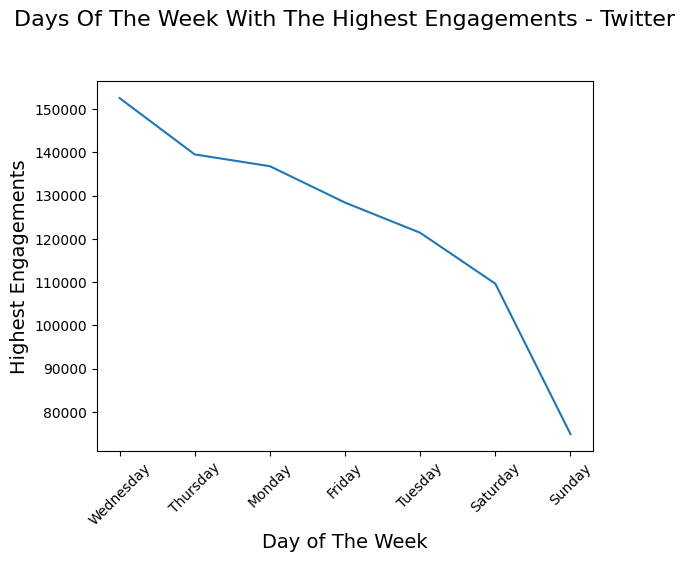

In [215]:
sns.lineplot(x = 'Day', y = 'Engagements', data = high_engagement_posts_by_weekday)
plt.xticks(rotation = 45)
plt.xlabel('Day of The Week', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Days Of The Week With The Highest Engagements - Twitter', fontsize = 16, pad = 40)
plt.show()

In [216]:
# We want to look at the months at which the most engaging posts overall happened on Twitter

month_of_high_post_engagemnts = twitter.groupby('Month')['Engagements'].sum()
high_engagement_posts_by_month = month_of_high_post_engagemnts.sort_values(ascending = False)
high_engagement_posts_by_month = high_engagement_posts_by_month.reset_index()
high_engagement_posts_by_month

,Month,Engagements
0,March,112209.0
1,April,96984.0
2,October,83130.0
3,September,79022.0
4,May,75921.0
5,February,68493.0
6,January,65467.0
7,June,61130.0
8,November,57666.0
9,December,56757.0


## On Twitter, the month of March has the highest engagements down the years, followed by April and October. 
## July, August and December are the months with the least engagements.

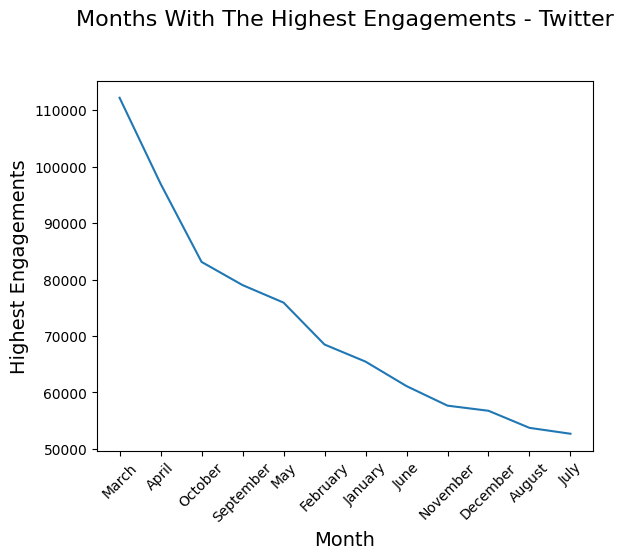

In [217]:
sns.lineplot(x = 'Month', y = 'Engagements', data = high_engagement_posts_by_month)
plt.xticks(rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Months With The Highest Engagements - Twitter', fontsize = 16, pad = 40)
plt.show()

### Key insights on Twitter data:
### - Photos were the type of posts that had the highest impressions; followed by Videos, Texts and Links respectively.
### - Photos are also the types of posts that have the highest engagements on average, followed by videos, texts and links.
### - Of the named individuals among the content creators, Sophia made the highest amount of posts, followed by Aramide, Blessing and Kemi.
### - Sophia, Kemi and  Aramide's posts have the highest impressions respectively.
### - Damilare, Kemi, Sophia and Aramide's posts have the highest engagements on average respectively.
### - There isn't much difference between average post engagements when the most common words are used, and when they're not.

## Recommendations for Twitter:
## - We should generally post our most important messages on Mondays, Wednesdays, and Thursdays, all after 5 pm.
## - We should prioritize Damilare, Kemi, Sophia and Aramide for such posts.
## - We should convey our most important messages fistly through pictures, and then videos. Less important information can be conveyed by texts and links.
## - We should tie our promotions or offers to the months of July, August, November and December, preferrably on Sundays, Tuesdays and Saturdays. These are the months with the least amount of engagements. If we could offer promos at this period, it will catch customers' attention, invite more customers to our side and improve engagement (e.g, a July promo reads: "Something good is coming from us next Tuesday! It's an exclusive offer that won't last long. Keep an eye on your Twitter timeline for details!").
## - We stand the best chance of selling out new products/services through posts during the months of March, April, September and October, preferrably on Mondays, Wednesdays and Thurdays. Post engagements are high during this period.

# LinkedIn

In [218]:
# Like we did for the Twitter data, let's read our data, remove columns which only carry empty values, drop duplicated rows, convert the "Date" column to a DateTme type, convert relevant columns to floats after removing the "%" and "," signs, fill the remaining null numerical values with 0, and create a "Day" and "Month" column

linkedin = pd.read_csv('Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_LinkedIn.csv').dropna(axis = 'columns', how = 'all').drop_duplicates()

linkedin['Date'] = pd.to_datetime(linkedin['Date'])
linkedin = linkedin.replace(['%', ','], ['', ''], regex = True)

linkedin.loc[:, 'Impressions' : 'Poll Votes'] = linkedin.loc[:, 'Impressions' : 'Poll Votes'].astype('float').fillna(0)

linkedin['Day'] = linkedin['Date'].dt.day_name()
linkedin['Month'] = linkedin['Date'].dt.month_name()

linkedin

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Engagement Rate (per Impression),Engagements,Reactions,Likes,Comments,Shares,Click-Through Rate,Post Link Clicks,Post Clicks (All),Video Views,Organic Video Views,Poll Votes,Tags,Day,Month
0,2023-07-13 12:03:00,7085212016608456704,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,Your money should not be a gamble. Before you ...,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,CIB Posts,Thursday,July
1,2023-07-12 20:00:00,7084969706025009152,LinkedIn,Post,Text,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,What skill (s) do you have that no one ever ta...,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Wednesday,July
2,2023-07-12 19:00:00,7084954641788018688,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:ugcPos...,Sade was able to acquire a home loan and make ...,NaN,63.0,63.0,9.52,6.0,3.0,3.0,0.0,0.0,4.76,3.0,3.0,0.0,0.0,0.0,Weekly Wealth Posts,Wednesday,July
3,2023-07-11 14:49:00,7084529022105231360,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,Safeguard every aspect of your operations with...,NaN,164.0,164.0,1.83,3.0,1.0,1.0,0.0,0.0,1.22,2.0,2.0,0.0,0.0,0.0,Weekly Wealth Posts,Tuesday,July
4,2023-07-11 09:17:00,7084445462967070721,LinkedIn,Post,Photo,Stanbic IBTC,Blessing Ubah,https://linkedin.com/feed/update/urn:li:share:...,Together we can make a difference and build a ...,NaN,376.0,376.0,5.05,19.0,11.0,11.0,0.0,0.0,2.13,8.0,8.0,0.0,0.0,0.0,NaN,Tuesday,July
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7755,2014-05-09 11:24:00,5870478259099037696,LinkedIn,Post,Photo,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,We understand that as a Nigerian living outsid...,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Friday,May
7756,2014-05-08 14:15:00,5870158839160012800,LinkedIn,Post,Photo,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,When going for an interview these tips might b...,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Thursday,May
7757,2014-05-07 13:28:00,5869784625840164864,LinkedIn,Post,Link,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,Are professional advisers important for small ...,http://www.forbes.com/sites/sage/2014/04/21/do...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Wednesday,May
7758,2014-05-06 13:40:00,5869425201195819008,LinkedIn,Post,Link,Stanbic IBTC,,https://linkedin.com/feed/update/urn:li:activi...,Do you own a business? Here's something on how...,http://socialmediatoday.com/1876456/why-your-b...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Tuesday,May


### Looking at the information below, we can see that the dataset has succesfully been cleaned and validated.

In [219]:
linkedin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7760 entries, 0 to 7759
Data columns (total 27 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              7760 non-null   datetime64[ns]
 1   Post ID                           7760 non-null   int64         
 2   Network                           7760 non-null   object        
 3   Post Type                         7760 non-null   object        
 4   Content Type                      7760 non-null   object        
 5   Profile                           7760 non-null   object        
 6   Sent by                           7760 non-null   object        
 7   Link                              7756 non-null   object        
 8   Post                              7729 non-null   object        
 9   Linked Content                    107 non-null    object        
 10  Impressions                       7760 non-null 

In [220]:
linkedin.groupby('Content Type')['Engagements'].mean().sort_values(ascending = False)

Content Type
Poll        615.000000
Document    260.000000
Photo        43.001079
Text         34.609442
Video        31.670996
Link         13.872727
Name: Engagements, dtype: float64

## On our LinkedIn outlet, polls are the content types that have the highest engagements on average, followed by documents and photos. Links have the least engagement.

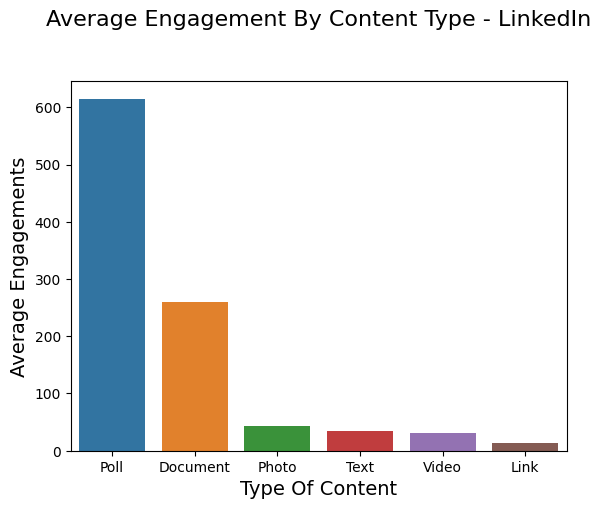

In [221]:
order = ['Poll','Document','Photo','Text','Video', 'Link']
sns.barplot(x = 'Content Type', y = 'Engagements', data = linkedin, ci = None, order = order)
plt.ylabel ('Average Engagements', fontsize = 14)
plt.xlabel('Type Of Content', fontsize = 14)
plt.title('Average Engagement By Content Type - LinkedIn', fontsize = 16,  pad = 40)
plt.show()

## Damilare, Aramide, Sophia and Kemi's posts have the highest engagements on average respectively.

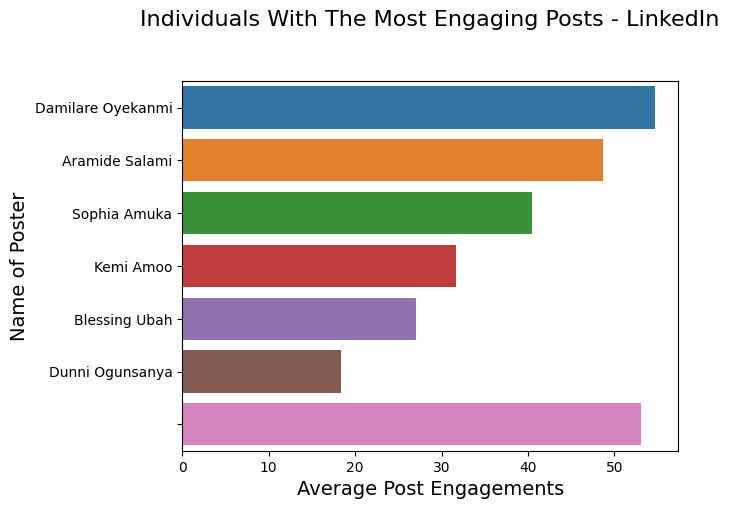

In [222]:
# Individuals with the highest post engagements on average

order = ['Damilare Oyekanmi', 'Aramide Salami', 'Sophia Amuka', 'Kemi Amoo', 'Blessing Ubah', 'Dunni Ogunsanya', ' ']
sns.barplot(x = 'Engagements', y = 'Sent by', data = linkedin, ci = None, order = order)
plt.title('Individuals With The Most Engaging Posts - LinkedIn', pad = 40, fontsize = 16)
plt.ylabel('Name of Poster', fontsize = 14)
plt.xlabel('Average Post Engagements', fontsize = 14)
plt.show()

In [223]:
# We want to look at the times of the day at which the most engaging posts happened on LinkedIn

time_of_high_post_engagemnts1 = linkedin.groupby(pd.Grouper(key='Date', freq='T'))['Engagements'].sum()
high_engagement_posts_by_time1 = time_of_high_post_engagemnts1.sort_values(ascending = False).head(10)
high_engagement_posts_by_time1 = high_engagement_posts_by_time1.reset_index()
high_engagement_posts_by_time1

,Date,Engagements
0,2022-05-01 14:57:00,6235.0
1,2022-10-06 17:41:00,5167.0
2,2022-02-08 13:47:00,4772.0
3,2022-10-13 11:24:00,4672.0
4,2022-01-07 16:24:00,3290.0
5,2022-04-29 15:45:00,3173.0
6,2022-02-02 13:07:00,3163.0
7,2022-01-11 19:08:00,3154.0
8,2019-01-26 16:44:00,2815.0
9,2022-05-25 20:01:00,2712.0


## On LinkedIn, the top 3 posts with the highest engagements over the years came after 1pm. And 90% of the most-engaging posts overall came after 1pm.

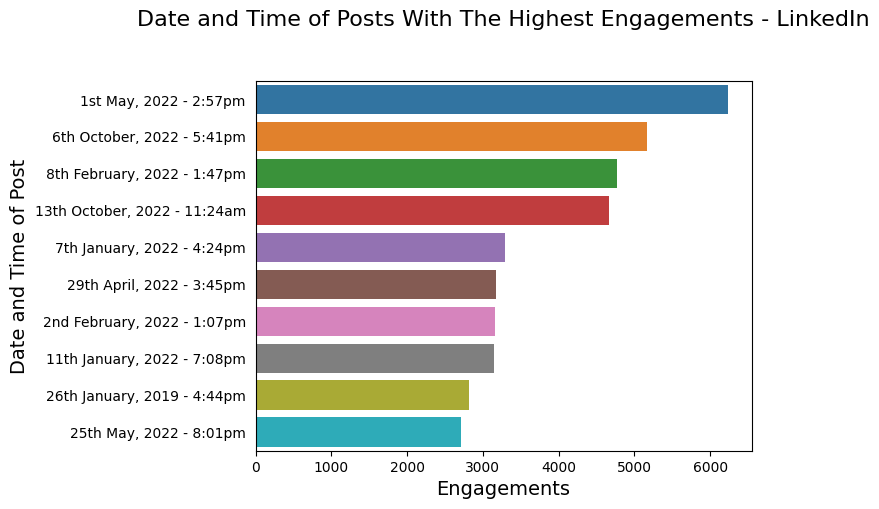

In [224]:
fig2 = sns.barplot(y = 'Date', x = 'Engagements', data = high_engagement_posts_by_time1)
fig2.set_yticklabels(['1st May, 2022 - 2:57pm', '6th October, 2022 - 5:41pm', '8th February, 2022 - 1:47pm', '13th October, 2022 - 11:24am', '7th January, 2022 - 4:24pm', '29th April, 2022 - 3:45pm', '2nd February, 2022 - 1:07pm', '11th January, 2022 - 7:08pm', '26th January, 2019 - 4:44pm', '25th May, 2022 - 8:01pm'])
plt.tick_params(left = False)
plt.xlabel('Engagements', fontsize = 14)
plt.ylabel('Date and Time of Post', fontsize = 14)
plt.title('Date and Time of Posts With The Highest Engagements - LinkedIn', fontsize = 16, pad = 40)
plt.show()

In [225]:
# We want to look at the days of the week at which the most engaging posts overall happened on LinkedIn


day_of_high_post_engagemnts1 = linkedin.groupby('Day')['Engagements'].sum()
high_engagement_posts_by_weekday1 = day_of_high_post_engagemnts1.sort_values(ascending = False)
high_engagement_posts_by_weekday1 = high_engagement_posts_by_weekday1.reset_index()
high_engagement_posts_by_weekday1

,Day,Engagements
0,Thursday,60245.0
1,Wednesday,59395.0
2,Friday,50145.0
3,Tuesday,45297.0
4,Monday,40649.0
5,Saturday,39093.0
6,Sunday,24597.0


## The posts with the highest engagements happen on Thursdays, followed by Wednesdays and Fridays. Sunday posts have the least engagements.

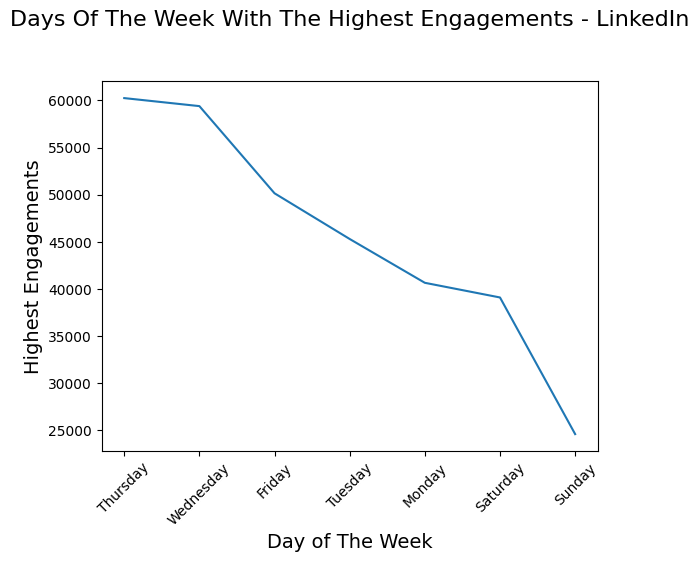

In [226]:
sns.lineplot(x = 'Day', y = 'Engagements', data = high_engagement_posts_by_weekday1)
plt.xticks(rotation = 45)
plt.xlabel('Day of The Week', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Days Of The Week With The Highest Engagements - LinkedIn', fontsize = 16, pad = 40)
plt.show()

In [227]:
# We want to look at the months at which the most engaging posts overall happened on Twitter

month_of_high_post_engagemnts1 = linkedin.groupby('Month')['Engagements'].sum()
high_engagement_posts_by_month1 = month_of_high_post_engagemnts1.sort_values(ascending = False)
high_engagement_posts_by_month1 = high_engagement_posts_by_month1.reset_index()
high_engagement_posts_by_month1

,Month,Engagements
0,November,35569.0
1,May,35477.0
2,April,34310.0
3,February,31507.0
4,January,28743.0
5,October,27436.0
6,March,22264.0
7,July,21749.0
8,June,21595.0
9,September,20976.0


## On LinkedIn, the month of November has the highest engagements down the years, followed by May and April. 
## September, August and December are the months with the least engagements respectively.

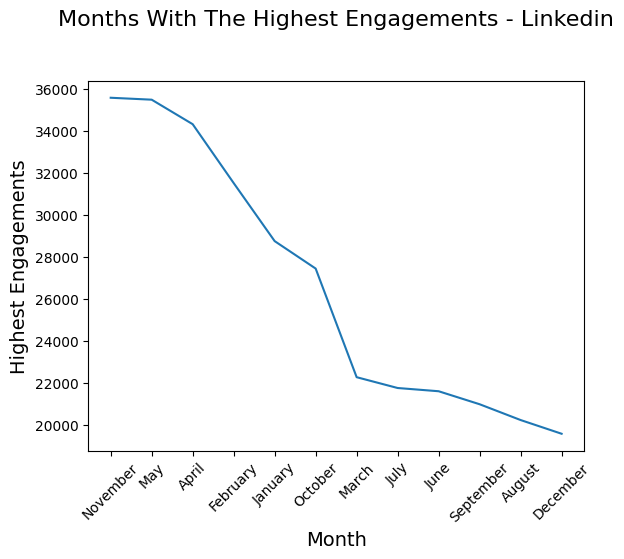

In [228]:
sns.lineplot(x = 'Month', y = 'Engagements', data = high_engagement_posts_by_month1)
plt.xticks(rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Months With The Highest Engagements - Linkedin', fontsize = 16, pad = 40)
plt.show()

## Key Insights on LinkedIn:
## On our LinkedIn outlet, polls are the content types that have the highest engagements on average, followed by documents and photos. Links have the least engagement.
## Damilare, Aramide, Sophia and Kemi's posts have the highest engagements on average respectively.
## - On LinkedIn, the top 3 posts with the highest engagements over the years came after 1pm. And 90% of the most-engaging posts overall came after 1pm.
## - The posts with the highest engagements happen on Thursdays, followed by Wednesdays and Fridays. Sunday posts have the least engagements.
## - On LinkedIn, the month of November has the highest engagements down the years, followed by May and April.
## September, August and December are the months with the least engagements respectively.

## Recommendations for LinkedIn:
## - We should generally post our most important messages on Thursdays, Wednesdays, and Fridays, all after 1 pm.
## - We should prioritize Damilare, Aramide, Sophia and Kemi for such posts.
## - We should convey our most important messages through polls, and then documents. Less important information can be conveyed by pictures and links.
## - We should tie our promotions or offers to the months of  August, September and December, preferrably on Mondays, Saturdays and Sundays. These are the months with the least amount of engagements. If we could offer promos at this period, it will catch customers' attention, invite more customers to our side and improve engagement (e.g, a July promo reads: "Something good is coming up from us this Sunday! It's an exclusive offer that won't last long. Keep an eye on your LinkedIn timeline for details").
## - We stand the chance of selling out new products/services through posts during the months of April, May and November, preferrably on Wednesdays, Thursdays and Fridays. Post engagements are high during this period.

# Instagram

In [229]:
# For our Instagram data, let's read our data, remove columns which only carry empty values, drop duplicated rows, convert the "Date" column to a DateTme type, convert relevant columns to floats after removing the "%" and "," signs, fill the remaining null numerical values with 0, and create a "Day" and "Month" column

instagram = pd.read_csv('Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Instagram.csv').dropna(axis = 'columns', how = 'all').drop_duplicates()

instagram['Date'] = pd.to_datetime(instagram['Date'])
instagram = instagram.replace(['%', ','], ['', ''], regex = True)

instagram.loc[:, 'Impressions' : 'Organic Video Views'] = instagram.loc[:, 'Impressions' : 'Organic Video Views'].astype('float').fillna(0)

instagram['Day'] = instagram['Date'].dt.day_name()
instagram['Month'] = instagram['Date'].dt.month_name()

instagram

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Impressions,Organic Impressions,Reach,Organic Reach,Engagement Rate (per Impression),Engagement Rate (per Reach),Engagements,Reactions,Likes,Comments,Saves,Video Views,Organic Video Views,Tags,Day,Month
0,2023-01-30 17:06:00,18216468940204235,Instagram,Post,Carousel,stanbicibtc,,https://www.instagram.com/p/CoC6CKBIHbV/,The new Naira banknotes in circulation have se...,39681.0,39681.0,32418.0,32418.0,4.89,5.99,1942.0,1261.0,1261.0,56.0,625.0,0.0,0.0,NaN,Monday,January
1,2022-04-15 09:04:00,17971531720518163,Instagram,Post,Photo,stanbicibtc,Blessing Ubah,https://www.instagram.com/p/CcXUQTEMRm7/,We hope the faith that this #GoodFriday restor...,29186.0,29186.0,25055.0,25055.0,6.04,7.04,1763.0,709.0,709.0,1033.0,21.0,0.0,0.0,NaN,Friday,April
2,2021-05-28 20:45:00,18008486986321009,Instagram,Post,Video,stanbicibtc,,https://www.instagram.com/p/CPbcdjygiaK/,Reposted from @mzdosunmu My son's entry\n#ITCA...,21175.0,21175.0,19237.0,19237.0,3.48,3.83,736.0,702.0,702.0,23.0,11.0,10392.0,10392.0,NaN,Friday,May
3,2023-01-04 16:08:00,17903404469640387,Instagram,Post,Carousel,stanbicibtc,,https://www.instagram.com/p/Cm_2oino-Me/,The new Naira banknotes in circulation have se...,23425.0,23425.0,18993.0,18993.0,4.48,5.53,1050.0,677.0,677.0,36.0,337.0,0.0,0.0,NaN,Wednesday,January
4,2021-12-07 18:52:00,17950858072558814,Instagram,Post,Photo,stanbicibtc,Blessing Ubah,https://www.instagram.com/p/CXMNAKFsjSs/,If you were born in June ‘cut soap for us oh’!...,21033.0,21033.0,18335.0,18335.0,6.58,7.54,1383.0,757.0,757.0,606.0,20.0,0.0,0.0,NaN,Tuesday,December
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2014-12-24 17:37:00,17841808444024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w_xUG5yvRB/,Withdraw cash up to 5 times pay bills or trans...,0.0,0.0,0.0,0.0,0.00,0.00,6.0,6.0,6.0,0.0,0.0,0.0,0.0,NaN,Wednesday,December
9996,2014-12-24 10:28:00,17841674617024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w_AUutyvQD/,#CardDiaries week 13\n\nI love Christmas! In m...,0.0,0.0,0.0,0.0,0.00,0.00,6.0,6.0,6.0,0.0,0.0,0.0,0.0,NaN,Wednesday,December
9997,2014-12-23 17:14:00,17842896850024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w9J5vpyvY4/,Eat-in this holidays. \nInstead of going out t...,0.0,0.0,0.0,0.0,0.00,0.00,6.0,6.0,6.0,0.0,0.0,0.0,0.0,NaN,Tuesday,December
9998,2014-12-23 10:38:00,17841674620024797,Instagram,Post,Photo,stanbicibtc,,https://www.instagram.com/p/w8cnwpSvY5/,If you do not move forward you will always be ...,0.0,0.0,0.0,0.0,0.00,0.00,7.0,7.0,7.0,0.0,0.0,0.0,0.0,NaN,Tuesday,December


In [230]:
instagram.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Date                              10000 non-null  datetime64[ns]
 1   Post ID                           10000 non-null  int64         
 2   Network                           10000 non-null  object        
 3   Post Type                         10000 non-null  object        
 4   Content Type                      10000 non-null  object        
 5   Profile                           10000 non-null  object        
 6   Sent by                           10000 non-null  object        
 7   Link                              10000 non-null  object        
 8   Post                              9989 non-null   object        
 9   Impressions                       10000 non-null  float64       
 10  Organic Impressions               10000 non-nul

### Looking at the information above, we can see that our Instagram dataset has succesfully been cleaned and validated.

### Time to derive insights from our data.

In [231]:
instagram.groupby('Content Type')['Engagements'].mean().sort_values(ascending = False)

Content Type
Video       133.014970
Photo        97.322311
Carousel     91.451482
Name: Engagements, dtype: float64

## On our Instagram outlet, videos are the content types that have the highest engagements on average, followed by photos and carousels.

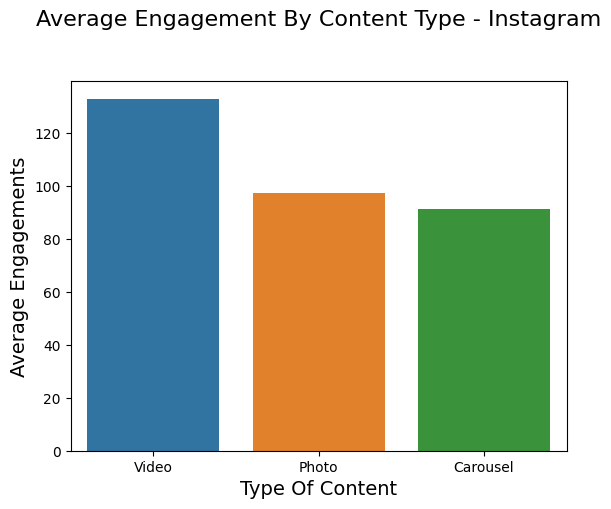

In [232]:
order = ['Video','Photo','Carousel']
sns.barplot(x = 'Content Type', y = 'Engagements', data = instagram, ci = None, order = order)
plt.ylabel ('Average Engagements', fontsize = 14)
plt.xlabel('Type Of Content', fontsize = 14)
plt.title('Average Engagement By Content Type - Instagram', fontsize = 16,  pad = 40)
plt.show()

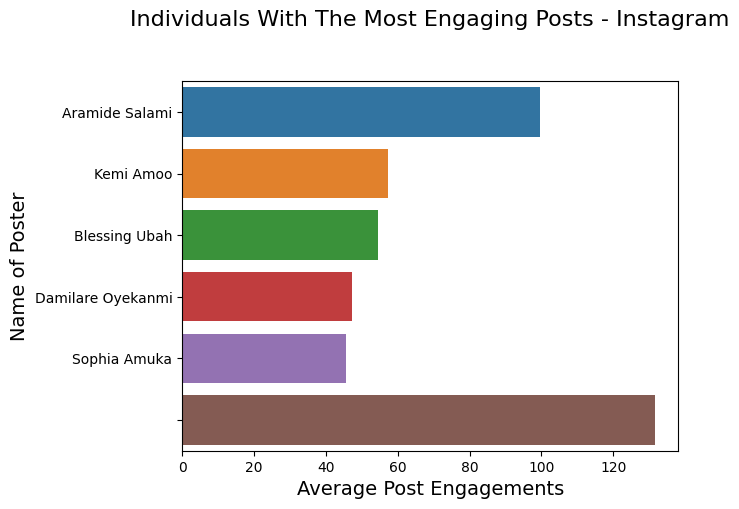

In [233]:
# Individuals with the highest post engagements on average

order = ['Aramide Salami', 'Kemi Amoo','Blessing Ubah', 'Damilare Oyekanmi','Sophia Amuka', ' ']

sns.barplot(x = 'Engagements', y = 'Sent by', data = instagram, ci = None, order = order)
plt.title('Individuals With The Most Engaging Posts - Instagram', pad = 40, fontsize = 16)
plt.ylabel('Name of Poster', fontsize = 14)
plt.xlabel('Average Post Engagements', fontsize = 14)
plt.show()

In [234]:
# We want to look at the times of the day at which the most engaging posts happened on Instagram

time_of_high_post_engagemnts2 = instagram.groupby(pd.Grouper(key='Date', freq='T'))['Engagements'].sum()
high_engagement_posts_by_time2 = time_of_high_post_engagemnts2.sort_values(ascending = False).head(10)
high_engagement_posts_by_time2 = high_engagement_posts_by_time2.reset_index()
high_engagement_posts_by_time2

,Date,Engagements
0,2022-05-27 10:35:00,33395.0
1,2022-05-28 10:27:00,29818.0
2,2022-05-28 14:05:00,29694.0
3,2022-05-27 10:32:00,29594.0
4,2022-05-28 14:24:00,27591.0
5,2022-05-27 11:27:00,27520.0
6,2022-05-27 14:15:00,27496.0
7,2022-05-27 10:34:00,5461.0
8,2022-05-28 14:12:00,4971.0
9,2022-05-28 20:04:00,4746.0


## On Instagram 90% of the most-engaging posts overall came between 10am and 2:30pm.

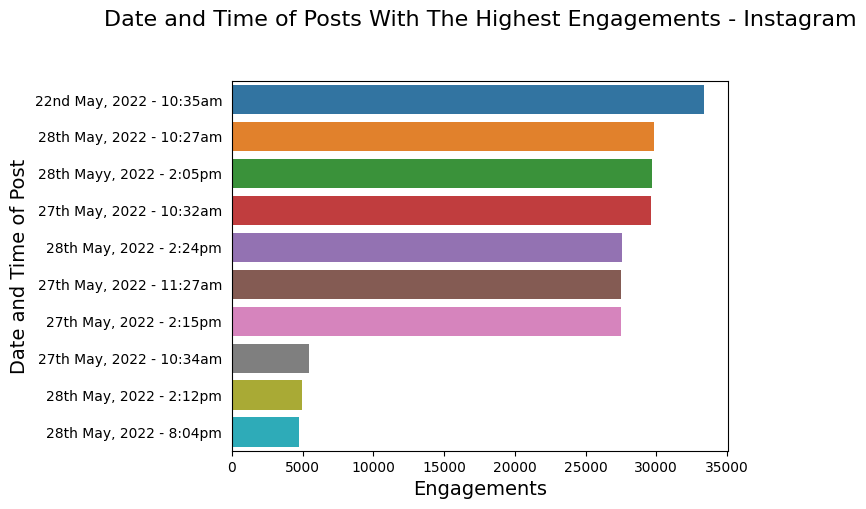

In [235]:
fig3 = sns.barplot(y = 'Date', x = 'Engagements', data = high_engagement_posts_by_time2)
fig3.set_yticklabels(['22nd May, 2022 - 10:35am', '28th May, 2022 - 10:27am', '28th Mayy, 2022 - 2:05pm', '27th May, 2022 - 10:32am', '28th May, 2022 - 2:24pm', '27th May, 2022 - 11:27am', '27th May, 2022 - 2:15pm', '27th May, 2022 - 10:34am', '28th May, 2022 - 2:12pm', '28th May, 2022 - 8:04pm'])
plt.tick_params(left = False)
plt.xlabel('Engagements', fontsize = 14)
plt.ylabel('Date and Time of Post', fontsize = 14)
plt.title('Date and Time of Posts With The Highest Engagements - Instagram', fontsize = 16, pad = 40)
plt.show()

In [236]:
# We want to look at the days of the week at which the most engaging posts overall happened on Instagram


day_of_high_post_engagemnts2 = instagram.groupby('Day')['Engagements'].sum()
high_engagement_posts_by_weekday2 = day_of_high_post_engagemnts2.sort_values(ascending = False)
high_engagement_posts_by_weekday2 = high_engagement_posts_by_weekday2.reset_index()
high_engagement_posts_by_weekday2

,Day,Engagements
0,Friday,271185.0
1,Saturday,203002.0
2,Thursday,121493.0
3,Wednesday,115086.0
4,Monday,114101.0
5,Tuesday,101395.0
6,Sunday,78369.0


## On Instagram, the posts with the highest engagements happen on Fridays, followed by Saturdays and Thursdays. Sunday posts have the least engagements.

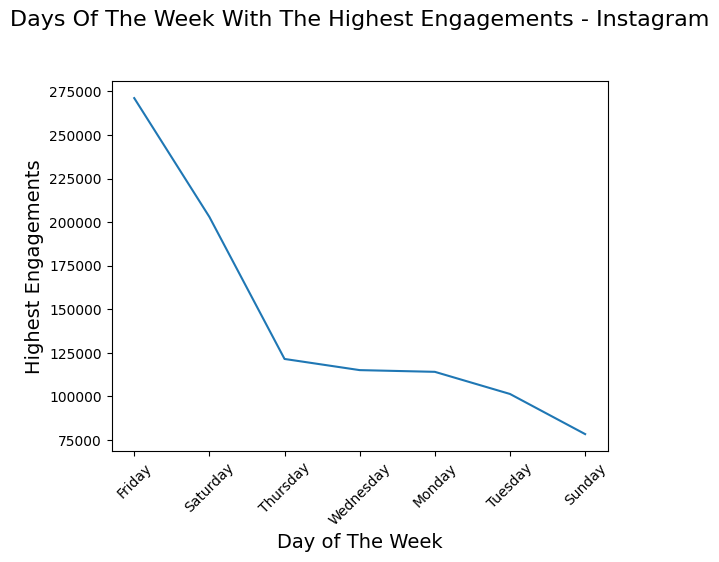

In [237]:
sns.lineplot(x = 'Day', y = 'Engagements', data = high_engagement_posts_by_weekday2)
plt.xticks(rotation = 45)
plt.xlabel('Day of The Week', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Days Of The Week With The Highest Engagements - Instagram', fontsize = 16, pad = 40)
plt.show()

In [238]:
# We want to look at the months at which the most engaging posts overall happened on Instagram

month_of_high_post_engagemnts2 = instagram.groupby('Month')['Engagements'].sum()
high_engagement_posts_by_month2 = month_of_high_post_engagemnts2.sort_values(ascending = False)
high_engagement_posts_by_month2 = high_engagement_posts_by_month2.reset_index()
high_engagement_posts_by_month2

,Month,Engagements
0,May,353506.0
1,March,71511.0
2,October,64477.0
3,November,64066.0
4,April,63302.0
5,February,63033.0
6,June,57723.0
7,December,55973.0
8,September,55665.0
9,January,54860.0


In [239]:
instagram.groupby('Month')['Engagements'].sum().max() / instagram['Engagements'].sum() * 100

35.18764601132157

## On Instagram, the month of May has the highest engagements down the years, followed by March and October. 
## 35% of all post engagements in our data came in the month of May.
## January, July and August are the months with the least engagements respectively.

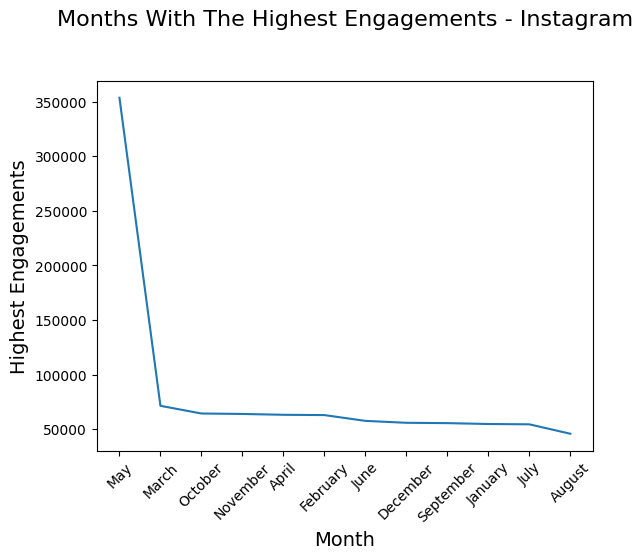

In [240]:
sns.lineplot(x = 'Month', y = 'Engagements', data = high_engagement_posts_by_month2)
plt.xticks(rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Months With The Highest Engagements - Instagram', fontsize = 16, pad = 40)
plt.show()

## Key Insights on Instagram:
## - On our Instagram outlet, videos are the content types that have the highest engagements on average, followed by photos and carousels.
## -  Aramide, Kemi and Blessing's posts have the highest engagements on average respectively.
## - On Instagram 90% of the most-engaging posts overall came between 10am and 2:30pm.
## - On Instagram, the posts with the highest engagements happen on Fridays, followed by Saturdays and Thursdays. Sunday posts have the least engagements.
## - On Instagram, the month of May has the highest engagements down the years, followed by March and October.
## 35% of all post engagements in our data came in the month of May.
## January, July and August are the months with the least engagements respectively.

## Recommendations for Instagram:
## - We should generally post our most important messages on Fridays, followed by Saturdays and Thursdays, all between 10am and 2:30pm.
## - We should prioritize Aramide, Kemi and Blessing for such posts.
## - We should convey our most important messages through videos, and then photos. Less important information can be conveyed through carousels.
## - We should tie our promotions or offers to the months of January, July and August, preferrably on Mondays, Tuesdays and Sundays. These are the months with the least amount of engagements. If we could offer promos at this period, it will catch customers' attention, invite more customers to our side and improve engagement (e.g, a July promo reads: "Something good is coming up from us this Sunday! It's an exclusive offer that won't last long. Keep an eye on your Instagram feed for details").
## - We stand the best chance of selling out new products/services through posts during the months of May, March and October, preferrably on Fridays, Saturdays and Thursdays. Post engagements are high during this period.

# Facebook

In [241]:
# For our Facebook data, let's read our data, remove columns which only carry empty values, drop duplicated rows, convert the "Date" column to a DateTme type, convert relevant columns to floats after removing the "%" and "," signs, fill the remaining null numerical values with 0, and create a "Day" and "Month" column

facebook = pd.read_csv('Post Performance (Stanbic IBTC) January 1, 2013 - July 13, 2023_Facebook.csv').dropna(axis = 'columns', how = 'all').drop_duplicates().drop(['Unique Paid Video Views', 'Unique 10-Second Video Views', 'Unique Full Video Views', 'Unique Organic 95% Video Views', 'Unique Paid 95% Video Views'], axis = 1)

facebook['Date'] = pd.to_datetime(facebook['Date'])
facebook = facebook.replace(['%', ','], ['', ''], regex = True)

facebook.loc[:, 'Impressions' : 'Unique Organic Video Views'] = facebook.loc[:, 'Impressions' : 'Unique Organic Video Views'].astype('float').fillna(0)

facebook['Day'] = facebook['Date'].dt.day_name()
facebook['Month'] = facebook['Date'].dt.month_name()

facebook

,Date,Post ID,Network,Post Type,Content Type,Profile,Sent by,Link,Post,Linked Content,Impressions,Organic Impressions,Viral Impressions,Non-viral Impressions,Paid Impressions,Fan Impressions,Fan Organic Impressions,Fan Paid Impressions,Non-fan Impressions,Non-fan Organic Impressions,Non-fan Paid Impressions,Reach,Organic Reach,Viral Reach,Non-viral Reach,Paid Reach,Fan Reach,Fan Paid Reach,Engagement Rate (per Impression),Engagement Rate (per Reach),Engagements,Reactions,Likes,Love Reactions,Haha Reactions,Wow Reactions,Sad Reactions,Angry Reactions,Comments,Shares,...,Unique Post Video Play Clicks,Unique Other Post Clicks,Unique Negative Feedback,Video Views,Organic Video Views,Paid Video Views,Partial Video Views,Organic Partial Video Views,Paid Partial Video Views,Full Video Views,Organic Full Video Views,Paid Full Video Views,Autoplay Video Views,Click to Play Video Views,Sound on Video Views,Sound off Video Views,10-Second Video Views,Organic 10-Second Video Views,Paid 10-Second Video Views,Autoplay 10-Second Video Views,Click to Play 10-Second Video Views,Sound on 10-Second Video Views,Sound off 10-Second Video Views,Autoplay Partial Video Views,Click to Play Partial Video Views,Autoplay Full Video Views,Click to Play Full Video Views,95% Video Views,Organic 95% Video Views,Paid 95% Video Views,Video Length (Seconds),Average Video Time Watched (Seconds),Video View Time (Seconds),Organic Video View Time (Seconds),Paid Video View Time (Seconds),Unique Video Views,Unique Organic Video Views,Tags,Day,Month
0,2022-12-17 17:08:00,253788558082460_5441020446025886,Facebook,Post,Video,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/253788558082460/posts...,We celebrated recently with Novare one of our ...,https://www.facebook.com/StanbicIBTC/videos/53...,207378.0,207378.0,5.0,207373.0,0.0,1147.0,1147.0,0.0,206231.0,206231.0,0.0,207378.0,207378.0,4.0,213627.0,0.0,1112.0,0.0,0.49,0.49,1024.0,179.0,176.0,3.0,0.0,0.0,0.0,0.0,59.0,2.0,...,50.0,577.0,13.0,982.0,982.0,0.0,917.0,917.0,0.0,65.0,65.0,0.0,960.0,22.0,634.0,348.0,270.0,270.0,0.0,261.0,9.0,186.0,84.0,897.0,0.0,63.0,2.0,19.0,19.0,0.0,84.07,3.47,14824.6,14824.6,0.0,975.0,975.0,CIB Posts,Saturday,December
1,2019-05-04 10:01:00,253788558082460_2001824979945467,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/253788558082460/posts...,N5k can get you started today. Call 01 280 126...,https://www.facebook.com/StanbicIBTC/photos/a....,125784.0,125784.0,23926.0,101858.0,0.0,103287.0,103287.0,0.0,22497.0,22497.0,0.0,92009.0,92009.0,17238.0,76074.0,0.0,76764.0,0.0,4.67,6.39,5876.0,762.0,747.0,10.0,1.0,4.0,0.0,0.0,572.0,47.0,...,0.0,2896.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Saturday,May
2,2020-06-02 21:00:00,253788558082460_2768996106561680,Facebook,Post,Photo,Stanbic IBTC,,https://www.facebook.com/StanbicIBTC/photos/a....,Still not sure whether to invest in the FGN Bo...,https://www.facebook.com/StanbicIBTC/photos/a....,89699.0,89699.0,9319.0,80380.0,0.0,79873.0,79873.0,0.0,9826.0,9826.0,0.0,84347.0,84347.0,8910.0,75068.0,0.0,74322.0,0.0,5.29,5.62,4744.0,465.0,458.0,6.0,0.0,0.0,0.0,1.0,855.0,29.0,...,0.0,1470.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Tuesday,June
3,2022-05-09 10:37:00,253788558082460_4808157902645480,Facebook,Post,Photo,Stanbic IBTC,Damilare Oyekanmi,https://www.facebook.com/StanbicIBTC/photos/a....,Let nothing stop you from achieving your goals...,https://www.facebook.com/StanbicIBTC/photos/a....,79118.0,79118.0,170.0,78948.0,0.0,3352.0,3352.0,0.0,75766.0,75766.0,0.0,78407.0,78407.0,166.0,78237.0,0.0,3245.0,0.0,0.56,0.57,445.0,102.0,101.0,1.0,0.0,0.0,0.0,0.0,11.0,2.0,...,0.0,275.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,NaN,Monday,May
4,2

In [242]:
facebook.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9803 entries, 0 to 9802
Data columns (total 98 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Date                                  9803 non-null   datetime64[ns]
 1   Post ID                               9803 non-null   object        
 2   Network                               9803 non-null   object        
 3   Post Type                             9803 non-null   object        
 4   Content Type                          9803 non-null   object        
 5   Profile                               9803 non-null   object        
 6   Sent by                               9803 non-null   object        
 7   Link                                  9803 non-null   object        
 8   Post                                  9553 non-null   object        
 9   Linked Content                        9462 non-null   object        
 10  

## The Facebook dataset has now successfully been cleaned and validated.

### Let's derive insights from our data.

In [243]:
facebook.groupby('Content Type')['Engagements'].mean().sort_values(ascending = False)

Content Type
Text     310.592920
Photo    216.619042
Video    145.625519
Link      78.197917
Name: Engagements, dtype: float64

## On our Facebook outlet, texts are the content types that have the highest engagements on average, followed by photos and videos. Links have the least engagements.

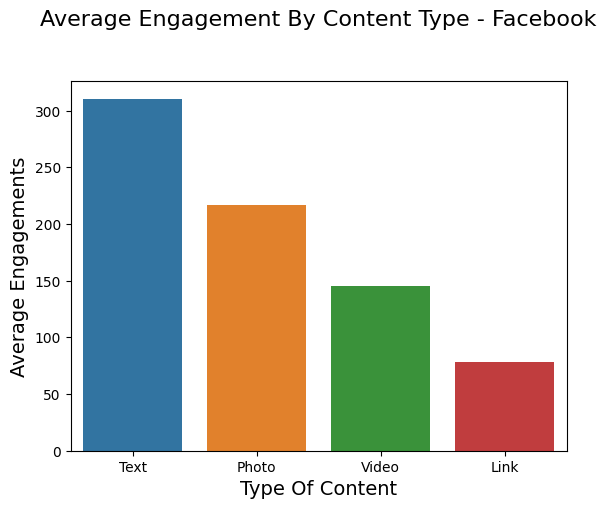

In [244]:
order = ['Text','Photo','Video', 'Link']
sns.barplot(x = 'Content Type', y = 'Engagements', data = facebook, ci = None, order = order)
plt.ylabel ('Average Engagements', fontsize = 14)
plt.xlabel('Type Of Content', fontsize = 14)
plt.title('Average Engagement By Content Type - Facebook', fontsize = 16,  pad = 40)
plt.show()

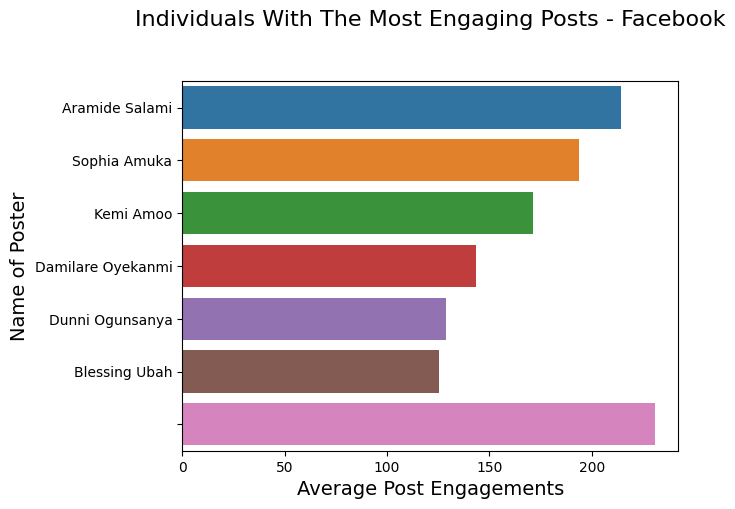

In [245]:
# Individuals with the highest post engagements on average

order = ['Aramide Salami', 'Sophia Amuka', 'Kemi Amoo','Damilare Oyekanmi', 'Dunni Ogunsanya', 'Blessing Ubah',  ' ']

sns.barplot(x = 'Engagements', y = 'Sent by', data = facebook, ci = None, order = order)
plt.title('Individuals With The Most Engaging Posts - Facebook', pad = 40, fontsize = 16)
plt.ylabel('Name of Poster', fontsize = 14)
plt.xlabel('Average Post Engagements', fontsize = 14)
plt.show()

In [246]:
# We want to look at the times of the day at which the most engaging posts happened on Facebook

time_of_high_post_engagemnts3 = facebook.groupby(pd.Grouper(key='Date', freq='T'))['Engagements'].sum()
high_engagement_posts_by_time3 = time_of_high_post_engagemnts3.sort_values(ascending = False).head(10)
high_engagement_posts_by_time3 = high_engagement_posts_by_time3.reset_index()
high_engagement_posts_by_time3

,Date,Engagements
0,2017-05-18 21:32:00,72474.0
1,2017-05-24 17:36:00,60004.0
2,2015-09-23 15:27:00,17453.0
3,2016-03-24 13:00:00,14853.0
4,2016-12-25 00:00:00,11508.0
5,2023-01-30 18:57:00,8287.0
6,2016-11-22 09:44:00,7366.0
7,2016-03-09 17:54:00,7062.0
8,2023-02-09 13:31:00,6919.0
9,2017-12-29 10:00:00,6713.0


## On Facebook, post engagements do not really depend on timeframe. Of the 10 most-engaging posts, they've all come in the morning, afternoon and evening.

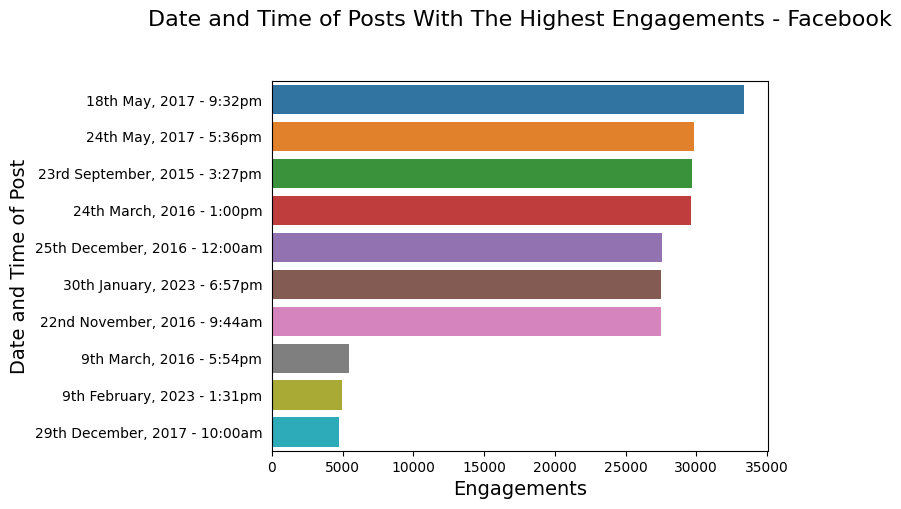

In [247]:
fig4 = sns.barplot(y = 'Date', x = 'Engagements', data = high_engagement_posts_by_time2)
fig4.set_yticklabels(['18th May, 2017 - 9:32pm', '24th May, 2017 - 5:36pm', '23rd September, 2015 - 3:27pm', '24th March, 2016 - 1:00pm', '25th December, 2016 - 12:00am', '30th January, 2023 - 6:57pm', '22nd November, 2016 - 9:44am', '9th March, 2016 - 5:54pm', '9th February, 2023 - 1:31pm', '29th December, 2017 - 10:00am'])
plt.tick_params(left = False)
plt.xlabel('Engagements', fontsize = 14)
plt.ylabel('Date and Time of Post', fontsize = 14)
plt.title('Date and Time of Posts With The Highest Engagements - Facebook', fontsize = 16, pad = 40)
plt.show()

In [248]:
# We want to look at the days of the week at which the most engaging posts overall happened on Instagram


day_of_high_post_engagemnts3 = facebook.groupby('Day')['Engagements'].sum()
high_engagement_posts_by_weekday3 = day_of_high_post_engagemnts3.sort_values(ascending = False)
high_engagement_posts_by_weekday3 = high_engagement_posts_by_weekday3.reset_index()
high_engagement_posts_by_weekday3

,Day,Engagements
0,Thursday,406984.0
1,Wednesday,403249.0
2,Friday,299646.0
3,Tuesday,288639.0
4,Monday,266573.0
5,Saturday,223438.0
6,Sunday,171830.0


## On Facebook, the posts with the highest engagements happen on Thursdays, followed by Wednesdays and Fridays. Sunday posts have the least engagements.

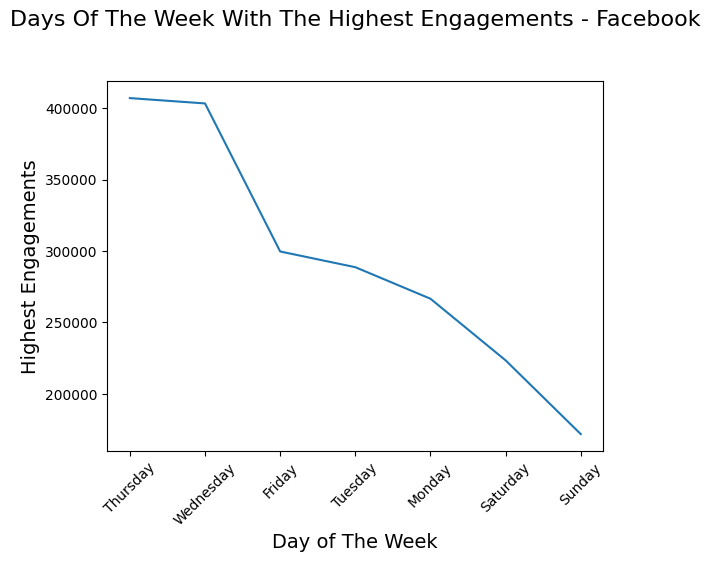

In [249]:
sns.lineplot(x = 'Day', y = 'Engagements', data = high_engagement_posts_by_weekday3)
plt.xticks(rotation = 45)
plt.xlabel('Day of The Week', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Days Of The Week With The Highest Engagements - Facebook', fontsize = 16, pad = 40)
plt.show()

In [250]:
# We want to look at the months at which the most engaging posts overall happened on Facebook

month_of_high_post_engagemnts3 = facebook.groupby('Month')['Engagements'].sum()
high_engagement_posts_by_month3 = month_of_high_post_engagemnts3.sort_values(ascending = False)
high_engagement_posts_by_month3 = high_engagement_posts_by_month3.reset_index()
high_engagement_posts_by_month3

,Month,Engagements
0,May,287523.0
1,March,261133.0
2,September,165858.0
3,April,165710.0
4,October,163287.0
5,February,163196.0
6,December,161442.0
7,January,150767.0
8,July,139848.0
9,August,135662.0


## On Facebook, the month of May has the highest engagements down the years, followed by March and September. 
## August, June and November are the months with the least engagements respectively.

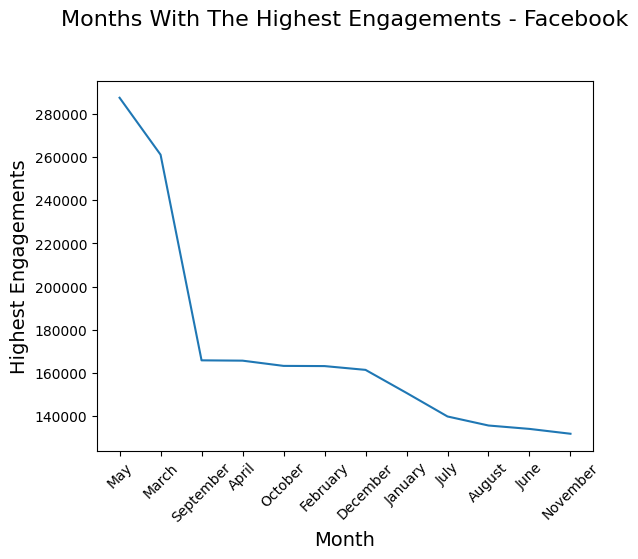

In [251]:
sns.lineplot(x = 'Month', y = 'Engagements', data = high_engagement_posts_by_month3)
plt.xticks(rotation = 45)
plt.xlabel('Month', fontsize = 14)
plt.ylabel('Highest Engagements', fontsize = 14)
plt.title('Months With The Highest Engagements - Facebook', fontsize = 16, pad = 40)
plt.show()

## Key Insights on Facebook
## - On our Facebook outlet, texts are the content types that have the highest engagements on average, followed by photos and videos. Links have the least engagements.
## -  Aramide, Sophia, Kemi and Damilare's posts have the highest engagements on average respectively.
## - On Facebook, post engagements do not really depend on timeframe. Of the 10 most-engaging posts, they've all come in the morning, afternoon and evening.
## - On Facebook, the posts with the highest engagements happen on Thursdays, followed by Wednesdays and Fridays. Sunday posts have the least engagements.
## - On Facebook, the month of May has the highest engagements down the years, followed by March and September.
## August, June and November are the months with the least engagements respectively.
## 

## Recommendations for Facebook:
## - We should generally post our most important messages on Thursdays, followed by Wednesdays and Fridays. Any time of the day is fine.
## - We should prioritize Aramide, Sophia, Kemi and Damilare for such posts.
## - We should convey our most important messages through texts, and then photos. Less important information can be conveyed through videos and links.
## - We should tie our promotions or offers to the months of June, August and November, preferrably on Mondays, Saturdays and Sundays. These are the months with the least amount of engagements. If we could offer promos at this period, it will catch customers' attention, invite more customers to our side and improve engagement (e.g, a June promo reads: "Something good is coming up from us this Sunday! It's an exclusive offer that won't last long. Keep an eye on your Facebook timeline for details").
## - We stand the best chance of selling out new products/services through posts during the months of May, March and September, preferrably on Thursdays, Wednesdays and Fridays respectively. Post engagements are high during this period.

# Model
## After thorough exploration and analysis, I was able to derive actionable insights from the data provided, such as:
## - Peak times or days of the week for the best post engagements
## - Individuals with the highest number of post engagements
## - The type of posts that catches the audience's attention the most and
## - The influence of certain topics/words over post engagements.

# Evaluation
##  I successfully created metrics to measure current progress and future approaches for better business-to-customer relations. The better these relations, the more profit we can get from customers. We want to keep customers happy and engaged, so we have to establish metrics on how to reach them, when to reach them, and what content they want to see to keep them happy.
## These metrics will be updated if new information come in.

# Conclusion
## Overall, we should treat each social media outlet individually and approach each outlet through the recommendations given. With this, we shall increase customer engagements, customer satisfaction, and bigger profits.